# Load python packages

In [2]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
from matplotlib.colors import LinearSegmentedColormap
from sklearn.metrics.pairwise import cosine_similarity

# Inital setting for plot size
from matplotlib import rcParams
FIGSIZE=(6, 6)
rcParams['figure.figsize']=FIGSIZE

sc.settings.verbosity = 1
# set number of cores to use
sc.settings.n_jobs = 25
sc.settings.set_figure_params( dpi=300, fontsize=6)
sc.logging.print_header()

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.24.3 scipy==1.10.1 pandas==2.2.1 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 louvain==0.8.2 pynndescent==0.5.10


# Load python functions

## Initial settings: color, order, trait

In [2]:
from initial_settings import *

## Similarity of cell types

In [2]:
# Define the colors
colors = ["#2C7BB6", "white", "#D7191C"]  # low, mid, high
n_bins = 100  # Increase this number for smoother transitions
cmap_name = "custom_gradient"

# Create the colormap using 'from_list'
cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

def similarity_cell_type_all(adata, cell_type, out_label, fig_size, file_out):
    # all cell_type
    all_cell_types = np.unique(adata.obs[cell_type])
    # cell types in different datasets
    cell_type_aging = np.unique(adata[adata.obs['Batch'] == 'Aging', :].obs[cell_type])
    cell_type_lister = np.unique(adata[adata.obs['Batch'] == 'Lister', :].obs[cell_type])
    fig_width = int(fig_size*len(cell_type_lister)/(len(cell_type_aging)+len(cell_type_lister)))
    fig_height = int(fig_size*len(cell_type_aging)/(len(cell_type_aging)+len(cell_type_lister)))
    

    # obtain average expression profiles for each cell_type in both cohorts    
    mean_expr_aging = {}
    mean_expr_lister = {}
    for sub_cell_type in all_cell_types:
        if(adata[(adata.obs['Batch'] == 'Aging') & (adata.obs[cell_type] == sub_cell_type), :].shape[0] > 0):
            mean_expr_aging[sub_cell_type] = adata[(adata.obs['Batch'] == 'Aging') & (adata.obs[cell_type] == sub_cell_type), :].X.mean(axis = 0).A1
        if(adata[(adata.obs['Batch'] == 'Lister') & (adata.obs[cell_type] == sub_cell_type), :].shape[0] > 0):
            mean_expr_lister[sub_cell_type] = adata[(adata.obs['Batch'] == 'Lister') & (adata.obs[cell_type] == sub_cell_type), :].X.mean(axis = 0).A1
        
    mean_expr_aging = pd.DataFrame(mean_expr_aging).T
    mean_expr_lister = pd.DataFrame(mean_expr_lister).T
            
    # compute pairwise cosine similarities
    with rc_context({'figure.figsize': (fig_width, fig_height)}):
        similar_cos = cosine_similarity(mean_expr_aging, mean_expr_lister)
        ax = sns.heatmap(similar_cos, cmap=cm, annot=True, xticklabels=mean_expr_lister.index, yticklabels=mean_expr_aging.index, linewidths=0)
        # Remove tick lines by setting their length to 0
        ax.tick_params(axis='both', length=0)
        plt.title('Cosine similarity at all age groups (%s)'%out_label)
        # plt.show()
    plt.savefig(file_out, transparent=True, format='pdf')

# Load R libraries

In [ ]:
# monocle3 conda environment
# Load libraries
library(Seurat)
library(Signac)
library(ggplot2)
library(dplyr)
library(zellkonverter)
set.seed(222)
library(RColorBrewer)
library(viridis)
library(monocle3)
library(tidyselect)
library(grid)
library(mgcv)
library(colorspace)
library(ggrepel)
library(igraph)
library(pbapply)
library(devtools)
library(parallel)
library(evobiR)
library(tidyr)
library(cluster)
library(grDevices)
library(repr)
library(zoo)
library(ggnewscale)
library(VennDiagram)
library(ggridges)
library(cowplot)

In [10]:
# R (Py39_R43_Ju10) for pseudotime plot
library(monocle3)
library(ggplot2)
library(cowplot)

# Load R functions

## Initial settings: color, order, trait

In [2]:
source("initial_settings.r")

## Load trajectory reconstruction and downstream analysis based on Kriegstein scripts

In [3]:
source("trajectory_reconstruction_based_on_kriestein.r")

## Plot basic density ridgeline

### Both lineage and branch level

In [4]:
branch_lineage <- c("EN_L6B" = "Deep_nonIT", "EN_L6_CT" = "Deep_nonIT", "EN_L5_6_NP" = "Deep_nonIT", 
                    "EN_L6_IT_1" = "Deep_IT", "EN_L6_IT_2" = "Deep_IT", 
                    "EN_L2_3_IT" = "Upper_IT", "EN_L3_5_IT_1" = "Upper_IT", "EN_L3_5_IT_2" = "Upper_IT", "EN_L3_5_IT_3" = "Upper_IT", 
                    "IN_SST" = "MGE", "IN_PVALB" = "MGE", "IN_PVALB_CHC" = "MGE", 
                    "IN_VIP" = "CGE", "IN_ADARB2_RAB37" = "CGE", "IN_ADARB2_COL12A1" = "CGE", "IN_ADARB2_SYT10" = "CGE", "IN_ADARB2_SV2C" = "CGE", "IN_LAMP5_RELN" = "CGE", "IN_LAMP5_LHX6" = "CGE", 
                    "OPC_major" = "OPC_major", "OPC_minor" = "OPC_minor", "Oligo" = "Oligo",
                    "Astro_PLSCR1" = "Astro_PLSCR1", "Astro_ADAMTSL3" = "Astro_ADAMTSL3")

plot_basic_density_ridgeline_pseudo_lineage_branch <- function(cds, branch_order, file_label, width, height, dpi){
    # prepare input data
    pseudo_lineage <- c() # lineage-level
    pseudo_branch <- c() # branch-level

    for(sub_lineage in names(cds@lineages)){
        # lineage-level
        sub_pseudo_lineage <- pseudotime(cds)[cds@lineages[[sub_lineage]]]
        names(sub_pseudo_lineage) <- rep(sub_lineage, times = length(sub_pseudo_lineage))
        pseudo_lineage <- c(pseudo_lineage, sub_pseudo_lineage)

        # branch-level
        sub_pseudo_branch <- sub_pseudo_lineage
        names(sub_pseudo_branch) <- rep(branch_lineage[sub_lineage], times = length(sub_pseudo_branch))
        pseudo_branch <- c(pseudo_branch, sub_pseudo_branch)
    }
    pseudo_lineage_df <- data.frame(pseudo_lineage = pseudo_lineage, lineage = names(pseudo_lineage))
    pseudo_lineage_df$lineage <- factor(pseudo_lineage_df$lineage, levels = names(cds@lineages))
    pseudo_branch_df <- data.frame(pseudo_branch = pseudo_branch, branch = names(pseudo_branch))
    pseudo_branch_df$branch <- factor(pseudo_branch_df$branch, levels = strsplit(branch_order, split = ";")[[1]])

    # lineage-level
    # density ridge
    p_lineage_density_ridge <- ggplot(pseudo_lineage_df, aes(x = pseudo_lineage, y = lineage)) +
      geom_density_ridges(aes(fill = lineage), bandwidth = 1) +
      scale_fill_manual(values = cols_subclass_uni) +
      # theme(legend.position = "none", text = element_text(size=20)) + 
      theme(legend.position = "none") + 
      labs(x = "pseudotime", y = "lineage") + 
      theme_minimal()
    
    # violin (order according to mean pseudotime)
    mean_values <- pseudo_lineage_df %>%
      group_by(lineage) %>%
      summarize(mean = mean(pseudo_lineage, na.rm = TRUE))
    
    # Reorder the factor levels based on mean values
    pseudo_lineage_df$lineage <- factor(pseudo_lineage_df$lineage, levels = mean_values %>% 
                                                    arrange(mean) %>% 
                                                    pull(lineage))
    p_lineage_violin <- ggplot(pseudo_lineage_df, aes(x = lineage, y = pseudo_lineage, fill = lineage)) +
        geom_violin() +
        geom_boxplot(width = 0.05, outlier.colour = NA) +
        stat_summary(fun.y = mean, geom = "point", shape = 20, size = 6, color = "white", fill = "white") +
        scale_fill_manual(values = cols_subclass_uni) +
        # theme(axis.text.x = element_text(angle = 45, hjust=1), text = element_text(size=20)) +
        theme(axis.text.x = element_text(angle = 45, hjust=1)) +
        labs(x = "lineage", y = "pseudotime") + 
        theme_minimal()

    # branch-level
    # density ridge
    p_branch_density_ridge <- ggplot(pseudo_branch_df, aes(x = pseudo_branch, y = branch)) +
      geom_density_ridges(aes(fill = branch), bandwidth = 1) +
      scale_fill_manual(values = cols_subclass_uni) +
      # theme(legend.position = "none", text = element_text(size=20)) + 
      theme(legend.position = "none") + 
      labs(x = "pseudotime", y = "branch") + 
      theme_minimal()
    
    # violin (order according to mean pseudotime)
    mean_values <- pseudo_branch_df %>%
      group_by(branch) %>%
      summarize(mean = mean(pseudo_branch, na.rm = TRUE))
    
    # Reorder the factor levels based on mean values
    pseudo_branch_df$branch <- factor(pseudo_branch_df$branch, levels = mean_values %>% 
                                                    arrange(mean) %>% 
                                                    pull(branch))

    p_branch_violin <- ggplot(pseudo_branch_df, aes(x = branch, y = pseudo_branch, fill = branch)) +
        geom_violin() +
        geom_boxplot(width = 0.05, outlier.colour = NA) +
        stat_summary(fun.y = mean, geom = "point", shape = 20, size = 6, color = "white", fill = "white") +
        scale_fill_manual(values = cols_subclass_uni) +
        # theme(axis.text.x = element_text(angle = 45, hjust=1), text = element_text(size=20)) +
        theme(axis.text.x = element_text(angle = 45, hjust=1)) +
        labs(x = "branch", y = "pseudotime") + 
        theme_minimal()
    
    print(p_lineage_density_ridge)
    print(p_branch_density_ridge)
    print(p_lineage_violin)
    print(p_branch_violin)
    ggsave(paste0(file_label, "_lineage_density_ridge.pdf"), plot = p_lineage_density_ridge, width = width, height = height, dpi = dpi)
    ggsave(paste0(file_label, "_branch_density_ridge.pdf"), plot = p_branch_density_ridge, width = width, height = height, dpi = dpi)
    ggsave(paste0(file_label, "_lineage_violin.pdf"), plot = p_lineage_violin, width = width, height = height, dpi = dpi)
    ggsave(paste0(file_label, "_branch_violin.pdf"), plot = p_branch_violin, width = width, height = height, dpi = dpi)
}

## Regression of pseudotime along age

In [55]:
regress_pt_along_age <- function(cds, lineage){
    par(pty = "s")
    plot(NULL, xlab = "Age", ylab = "Pseudotime", main = paste0("Regression of pseudotime along age in ", lineage), 
         xlim = c(min(colData(cds)$numerical_age), max(colData(cds)$numerical_age)), 
         ylim = c(min(pseudotime(cds)), max(pseudotime(cds))), type="n")
    for(sub_lin in names(cds@lineages)){
        mod.smsp <- smooth.spline(x = cds@colData['numerical_age'][cds@lineages[[sub_lin]], ], 
                                  y = pseudotime(cds)[cds@lineages[[sub_lin]]], 
                                  spar = 1)
        lines(mod.smsp$x, mod.smsp$y, lwd = 3, col = cols_subclass_uni[sub_lin])
        points(cds@colData['numerical_age'][cds@lineages[[sub_lin]], ], pseudotime(cds)[cds@lineages[[sub_lin]]], pch = 20, col = cols_subclass_uni[sub_lin])
    }
    legend("bottomright", legend = names(cds@lineages), col = cols_subclass_uni[names(cds@lineages)], lwd = 3, inset = c(0.02, 0.02))
}

# Load data

In [ ]:
adata = sc.read('aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_adata.h5ad')
adata # 1,452,103 × 14,668

In [5]:
adata.obs['cell_type_uni'].value_counts()

Oligo     437465
EN        349350
IN        254695
Astro     173241
OPC       116155
Immune     74921
Mural      22824
Endo       21535
Others      1917
Name: cell_type_uni, dtype: int64

In [6]:
adata.obs['class'].value_counts()

Oligo     415094
EN        292325
IN        227984
Astro     149415
OPC       105465
Immune     69924
Mural      22824
Endo       21535
Name: class, dtype: int64

In [8]:
adata.obs['major_clust'].value_counts()

Astro           23826
L2-3_CUX2       23665
Oligo           22371
L4_RORB         14465
OPC             10690
L5-6_TLE4        8566
SST              7348
L5-6_THEMIS      7281
VIP              6728
Micro            4997
ID2              4818
PV               3778
PN_dev           3048
MGE_dev          1453
Vas              1074
PV_SCUBE3         974
Poor-Quality      843
LAMP5_NOS1        816
CGE_dev           796
Name: major_clust, dtype: int64

In [9]:
149415+23826

173241

# Obtain lineage and merge annotations

In [10]:
ad_ast = adata[adata.obs['cell_type_uni'] == 'Astro', :]
ad_ast # 173,241 × 14,668

View of AnnData object with n_obs × n_vars = 173241 × 14668
    obs: 'Batch', 'SubID', 'Age', 'Sex', 'PMI', 'cell_type_uni', 'subclass_uni', 'subtype_uni', 'dev_mat_uni', 'numerical_age', 'stage_id', 'Channel', 'Source', 'poolID', 'prep', 'rep', 'class', 'subclass', 'subtype', 'RL#', 'age', 'chem', 'concat_id', 'Race', 'Brain Regions*', 'Cause of Death', 'ICD-10 Code', 'ICD-10 category', 'Oxygen/No Oxygen', 'Date-of-Collection', 'Collection_year', 'Library Prep Date', 'Library Prep Lot', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'doublet_score', 'log10_gene_counts', 'log10_UMI_counts', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden', 'mat/dev', 'cell_type', 'major_clust', 'sub_clust'
    var: 'gene_id-Aging', 'gene_name-Aging', 'gene_type-Aging', 'gene_chrom-Aging', 'gene_start-Aging', 'gene_end-Aging', 'n_cells-Aging', 'percent_cells-Aging', 'robust-Aging', 'highly_variable_features-Aging', 'ribosomal-Aging', 'mitochondrial-Aging', 'pro

In [ ]:
ad_ast.obs['subtype_uni'].value_counts()

## Cell type similarity between two cohorts

In [14]:
ad_ast.write('aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_AST.h5ad')


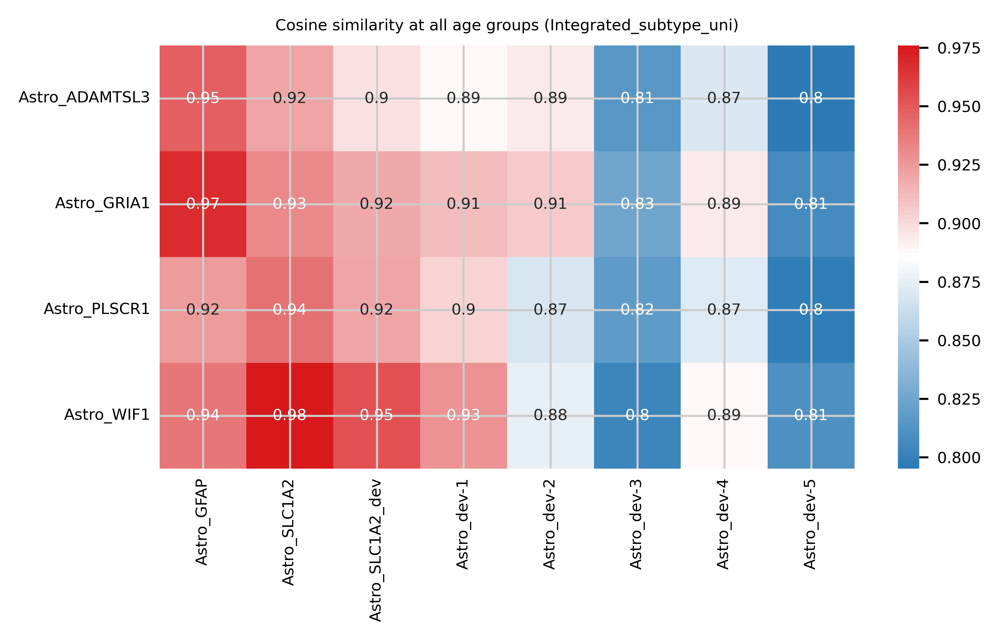

In [4]:
similarity_cell_type_all(ad_ast, 'subtype_uni', 'Integrated_subtype_uni', 10, 'files/freeze3/figures/ast_similarity_two_cohorts_subtype_uni_all.pdf')


## Basic UMAP and UMAT analysis

In [ ]:
%%sh

python lineage_analysis_ryan_lister_fromLineageData.py \
-l aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_AST.h5ad \
-r 123456 \
-v scanpy@6000 \
-p half \
-n 25 \
-o aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_AST_scanpy6000_25_sparse_123456 \
-k no \
-s False

### 6000 hvgs

In [3]:
adata_6k = sc.read('aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_AST_scanpy6000_25_sparse_123456_clustering.h5ad')
adata_6k # 173,241 × 14,613

AnnData object with n_obs × n_vars = 173241 × 14613
    obs: 'Batch', 'SubID', 'Age', 'Sex', 'PMI', 'cell_type_uni', 'subclass_uni', 'subtype_uni', 'dev_mat_uni', 'numerical_age', 'stage_id', 'Channel', 'Source', 'poolID', 'prep', 'rep', 'class', 'subclass', 'subtype', 'RL#', 'age', 'chem', 'concat_id', 'Race', 'Brain Regions*', 'Cause of Death', 'ICD-10 Code', 'ICD-10 category', 'Oxygen/No Oxygen', 'Date-of-Collection', 'Collection_year', 'Library Prep Date', 'Library Prep Lot', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'doublet_score', 'log10_gene_counts', 'log10_UMI_counts', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden', 'mat/dev', 'cell_type', 'major_clust', 'sub_clust'
    var: 'gene_id-Aging', 'gene_name-Aging', 'gene_type-Aging', 'gene_chrom-Aging', 'gene_start-Aging', 'gene_end-Aging', 'n_cells-Aging', 'percent_cells-Aging', 'robust-Aging', 'highly_variable_features-Aging', 'ribosomal-Aging', 'mitochondrial-Aging', 'protein_cod

#### stage_id

In [ ]:
from pandas.api.types import CategoricalDtype
adata_6k.obs['stage_id_ord'] = adata_6k.obs['stage_id']
cat_dtype = CategoricalDtype(categories=adata_6k.uns['stage_order'], ordered=True)
adata_6k.obs['stage_id_ord'] = adata_6k.obs['stage_id_ord'].astype(cat_dtype)
adata_6k

/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/sc/arion/work/yangh17/conda/envs/snRNAseq_py3.9/lib/python3.9/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cma

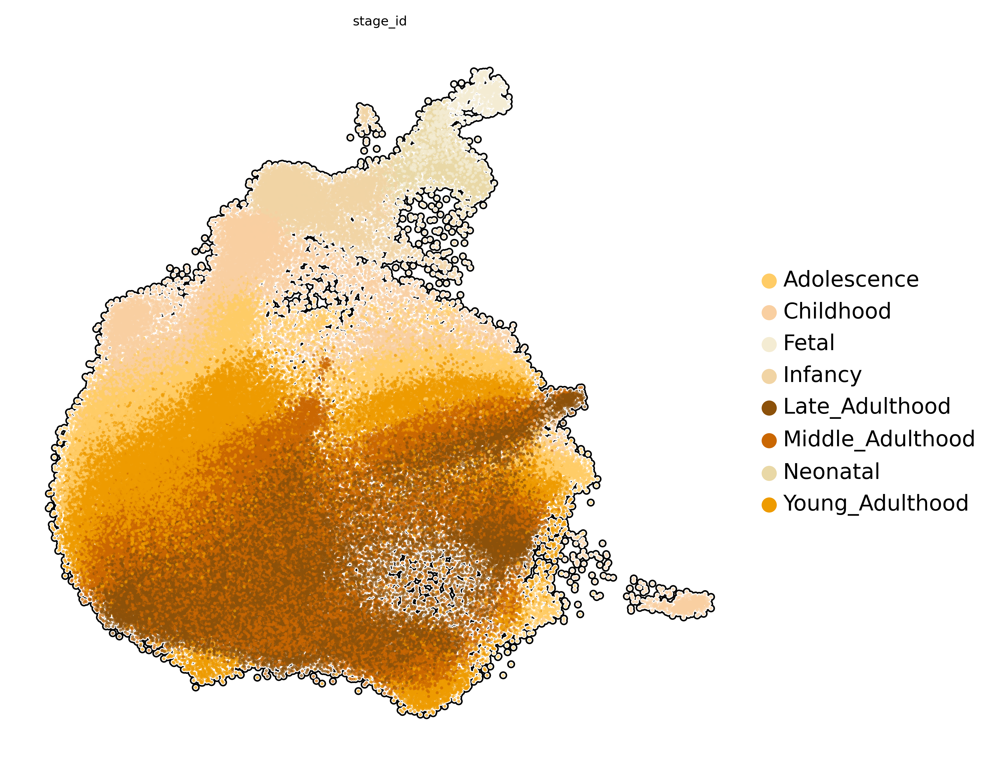

In [17]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.embedding(adata_6k, basis = 'umat', color='stage_id', add_outline=True,cmap='vlag',#legend_loc='on data',
               legend_fontsize=10, legend_fontoutline=2,frameon=False,palette=colors_stage_id,
               outline_width=(0.5, 0.3), vmin=0, vmax=1,size=8,
               return_fig=True)
plt.savefig('ast_data_umat_stage_id.pdf', transparent=True, format='pdf')

# Pseudotime infer

In [ ]:
%%sh

Rscript pseudotime_infer.R \
aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_AST_scanpy6000_25_sparse_123456_clustering.h5ad \
aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_AST_scanpy6000_25_sparse_123456 \
12 \
8

## Data visualization

In [4]:
cds <- readRDS("/sc/arion/projects/CommonMind/aging/hui/files/freeze3/aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_AST_scanpy6000_25_sparse_123456_beforeConstruction_cds.RDS")
d <- readRDS("/sc/arion/projects/CommonMind/aging/hui/files/freeze3/aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_AST_scanpy6000_25_sparse_123456_beforeConstruction_d.RDS")
print(cds)
print(head(d))

class: cell_data_set_ext 
dim: 14613 173241 
metadata(0):
assays(2): counts logcounts
rownames(14613): DPM1 SCYL3 ... OOSP1 C8orf44-SGK3
rowData names(2): gene_name gene_short_name
colnames(173241): H1007-1-AACACACAGTAATTGG-0-Aging
  H1007-1-AACTTCTCATCTCGTC-0-Aging ...
  TTTGTTGAGCGATTCT-RL2132_25yr_v3-Lister
  TTTGTTGCACAAGCTT-RL2132_25yr_v3-Lister
colData names(55): orig.ident nCount_RNA ... ident Size_Factor
reducedDimNames(1): UMAP
mainExpName: RNA
altExpNames(0):
       UMAP_1     UMAP_2
Y_1 -7.858545 -0.2906263
Y_2 -7.718974 -1.0703506
Y_3 -7.056978 -1.2491442
Y_4 -6.250305 -2.8003048
Y_5 -6.918032 -2.4293929
Y_6 -6.444634 -2.3866264


Warning message:
“`select_()` was deprecated in dplyr 0.7.0.
ℹ Please use `select()` instead.
ℹ The deprecated feature was likely used in the monocle3 package.
  Please report the issue to the authors.”


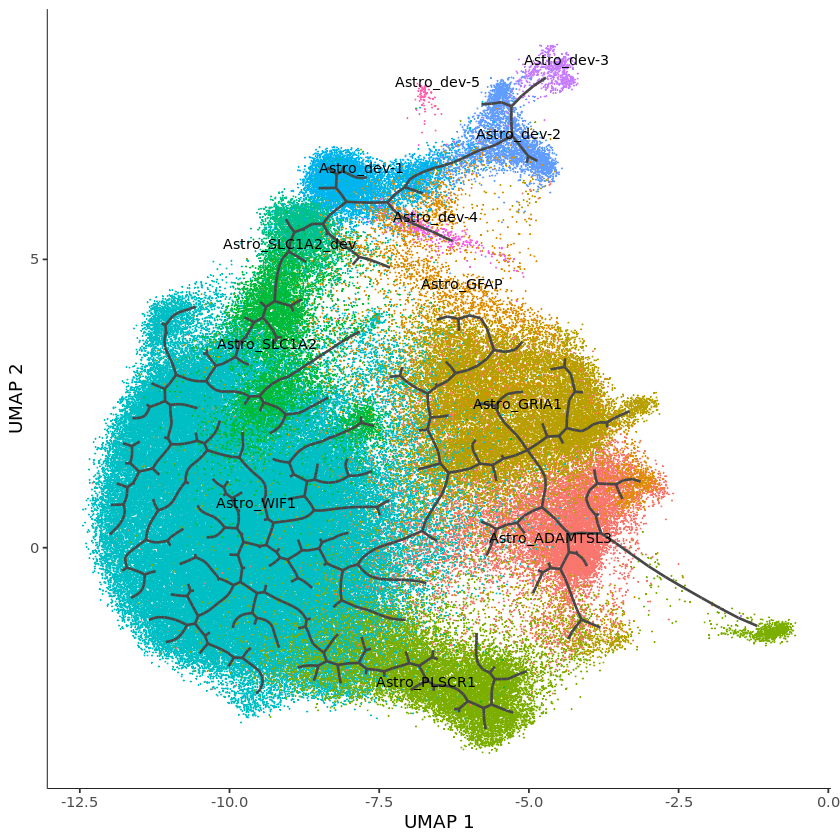

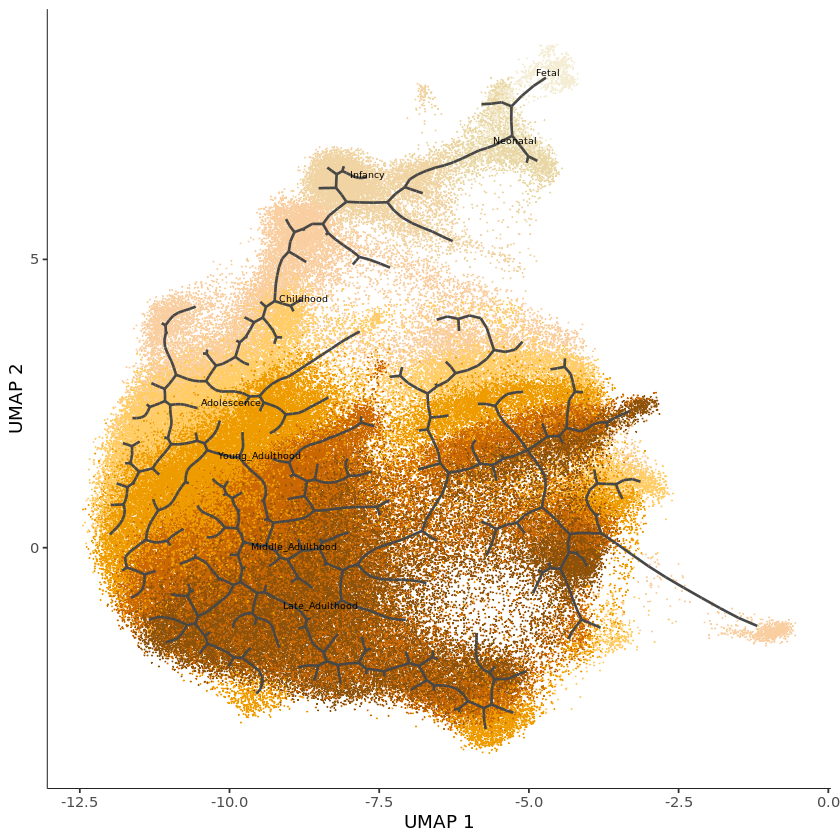

In [5]:
plot_cells(cds, color_cells_by = "subtype_uni", label_leaves = F, label_branch_points = F, label_principal_points = F, label_groups_by_cluster = F, group_label_size = 3)

plot_cells(cds, color_cells_by = "stage_id", label_leaves = F, label_branch_points = F, label_principal_points = F, label_groups_by_cluster = F) +
    scale_color_manual(values = cols_stage_id)

### Principle graphs

#### unit: 500

In [ ]:
for(i in seq(0, 2, 1)){
    print(ggplot(data=d, aes(x=UMAP_1, y=UMAP_2)) + geom_point(size=0.005) + geom_text_repel(data=d[(500*i+1):min(500*(i+1), 943), ], aes(x=UMAP_1, y=UMAP_2), label=rownames(d[(500*i+1):min(500*(i+1), 943), ]), size=2, hjust = 2, color = "red", max.overlaps = Inf, segment.size = 0.1))
}

#### unit: 200

In [ ]:
for(i in seq(0, 5, 1)){
    print(ggplot(data=d, aes(x=UMAP_1, y=UMAP_2)) + geom_point(size=0.005) + geom_text_repel(data=d[(200*i+1):min(200*(i+1), 943), ], aes(x=UMAP_1, y=UMAP_2), label=rownames(d[(200*i+1):min(200*(i+1), 943), ]), size=2, hjust = 2, color = "red", max.overlaps = Inf, segment.size = 0.1))
}

#### unit: 100

In [ ]:
for(i in seq(0, 10, 1)){
    print(ggplot(data=d, aes(x=UMAP_1, y=UMAP_2)) + geom_point(size=0.005) + geom_text_repel(data=d[(100*i+1):min(100*(i+1), 943), ], aes(x=UMAP_1, y=UMAP_2), label=rownames(d[(100*i+1):min(100*(i+1), 943), ]), size=2, hjust = 2, color = "red", max.overlaps = Inf, segment.size = 0.1))
}

#### unit: 50

In [ ]:
for(i in seq(0, 19, 1)){
    print(ggplot(data=d, aes(x=UMAP_1, y=UMAP_2)) + geom_point(size=0.005) + geom_text_repel(data=d[(50*i+1):min(50*(i+1), 943), ], aes(x=UMAP_1, y=UMAP_2), label=rownames(d[(50*i+1):min(50*(i+1), 943), ]), size=2, hjust = 2, color = "red", max.overlaps = Inf, segment.size = 0.1))
}

### Start point

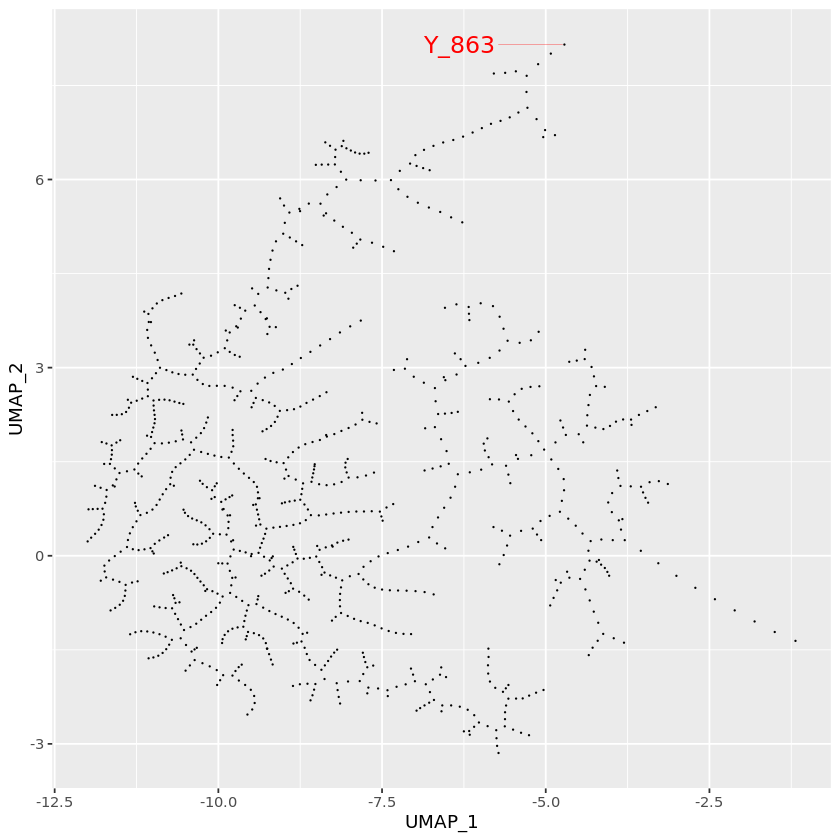

In [13]:
ggplot(data=d, aes(x=UMAP_1, y=UMAP_2)) + geom_point(size=0.01) + geom_text_repel(data=d[c(863), ], aes(x=UMAP_1, y=UMAP_2), label=rownames(d[c(863), ]), size=5, hjust = 2, color = "red", max.overlaps = Inf, segment.size = 0.1)


### Astro_PLSCR1

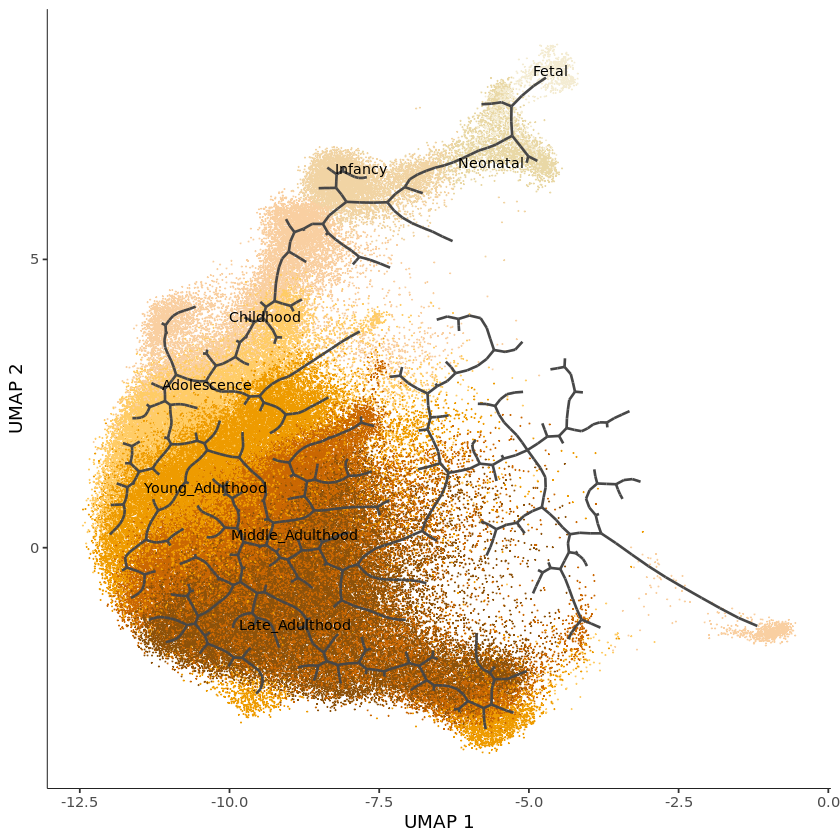

In [6]:
subtypes_to_keep <- c("Astro_dev-3", "Astro_dev-2", "Astro_dev-1", "Astro_SLC1A2_dev", "Astro_SLC1A2", "Astro_WIF1", "Astro_PLSCR1")
cells_to_keep <- which(colData(cds)$subtype_uni %in% subtypes_to_keep)
cds_subset <- cds[, cells_to_keep]
plot_cells(cds_subset, color_cells_by = "stage_id", label_leaves = F, label_branch_points = F, label_principal_points = F, label_groups_by_cluster = F, group_label_size = 3) +
    scale_color_manual(values = cols_stage_id)


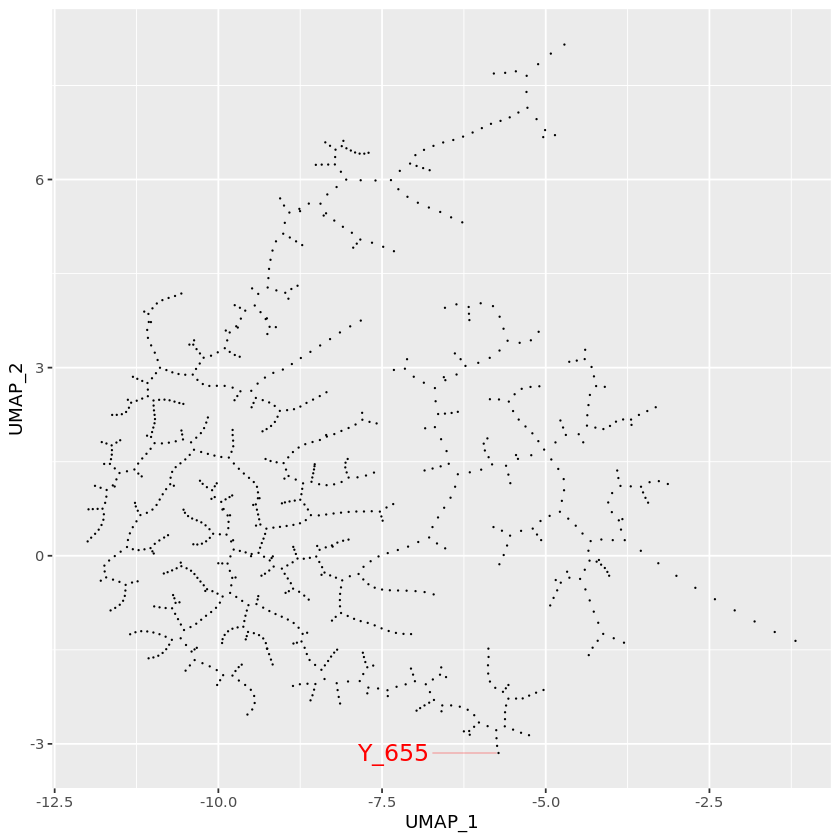

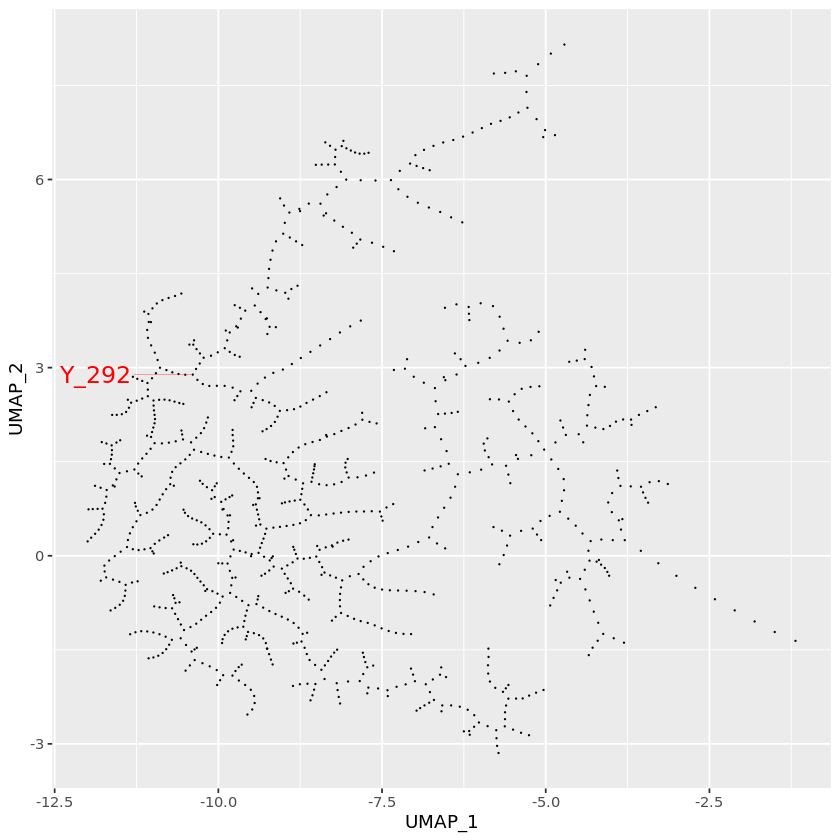

In [20]:
# terminal
ggplot(data=d, aes(x=UMAP_1, y=UMAP_2)) + geom_point(size=0.01) + geom_text_repel(data=d[c(655), ], aes(x=UMAP_1, y=UMAP_2), label=rownames(d[c(655), ]), size=5, hjust = 2, color = "red", max.overlaps = Inf, segment.size = 0.1)

# included node
ggplot(data=d, aes(x=UMAP_1, y=UMAP_2)) + geom_point(size=0.01) + geom_text_repel(data=d[c(292), ], aes(x=UMAP_1, y=UMAP_2), label=rownames(d[c(292), ]), size=5, hjust = 2, color = "red", max.overlaps = Inf, segment.size = 0.1)


### Astro_ADAMTSL3

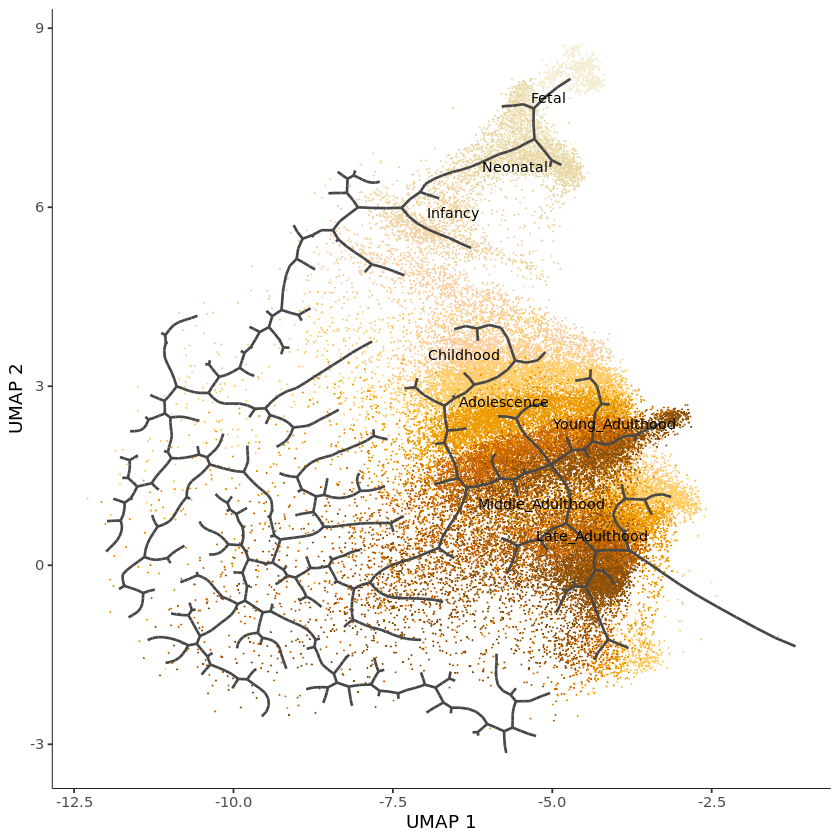

In [7]:
subtypes_to_keep <- c("Astro_dev-3", "Astro_dev-2", "Astro_GFAP", "Astro_dev-4", "Astro_GRIA1", "Astro_ADAMTSL3")
cells_to_keep <- which(colData(cds)$subtype_uni %in% subtypes_to_keep)
cds_subset <- cds[, cells_to_keep]
plot_cells(cds_subset, color_cells_by = "stage_id", label_leaves = F, label_branch_points = F, label_principal_points = F, label_groups_by_cluster = F, group_label_size = 3) +
    scale_color_manual(values = cols_stage_id)


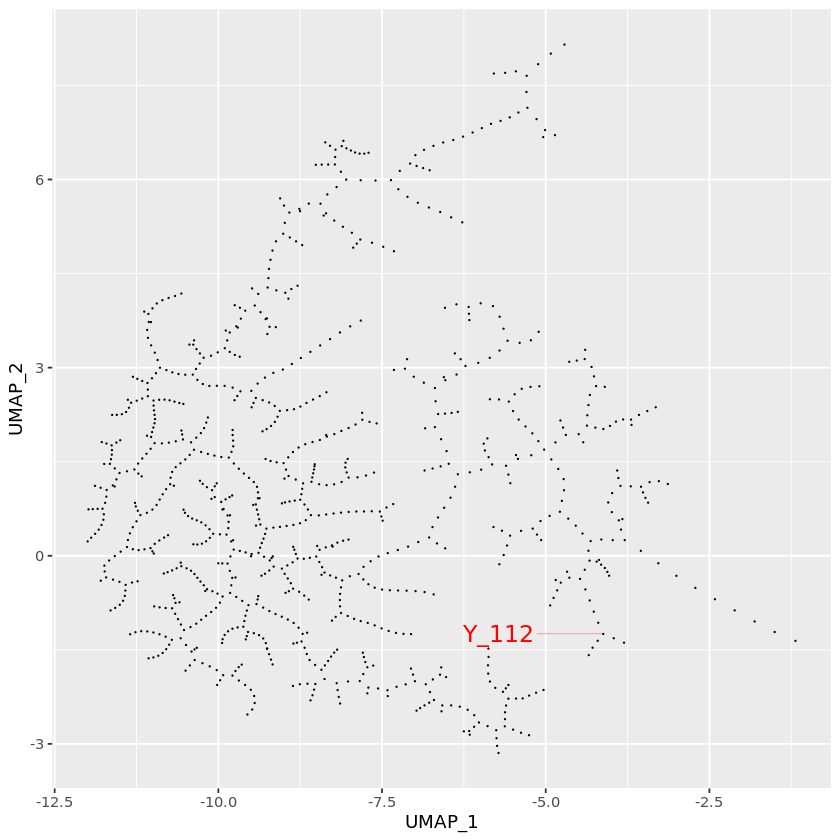

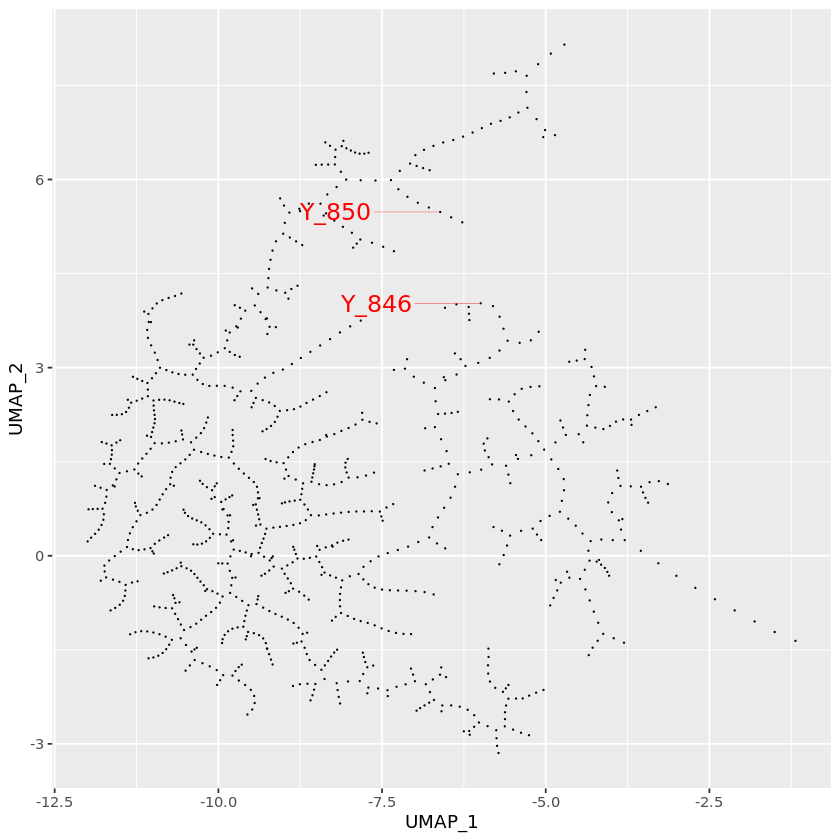

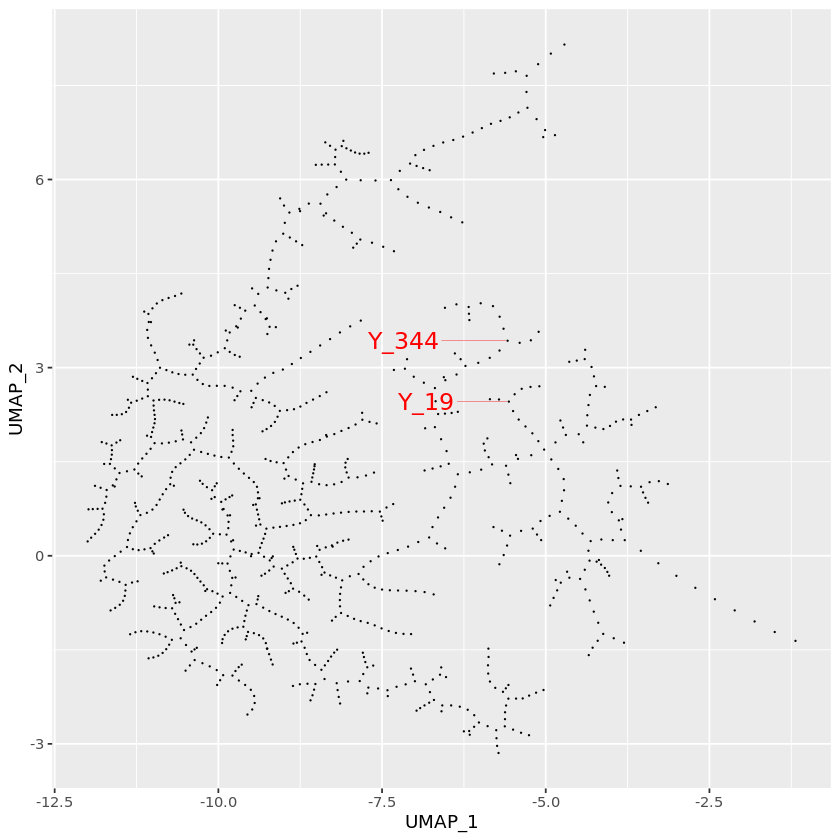

In [21]:
# terminal
ggplot(data=d, aes(x=UMAP_1, y=UMAP_2)) + geom_point(size=0.01) + geom_text_repel(data=d[c(112), ], aes(x=UMAP_1, y=UMAP_2), label=rownames(d[c(112), ]), size=5, hjust = 2, color = "red", max.overlaps = Inf, segment.size = 0.1)

# connection
ggplot(data=d, aes(x=UMAP_1, y=UMAP_2)) + geom_point(size=0.01) + geom_text_repel(data=d[c(850, 846), ], aes(x=UMAP_1, y=UMAP_2), label=rownames(d[c(850, 846), ]), size=5, hjust = 2, color = "red", max.overlaps = Inf, segment.size = 0.1)
ggplot(data=d, aes(x=UMAP_1, y=UMAP_2)) + geom_point(size=0.01) + geom_text_repel(data=d[c(344, 19), ], aes(x=UMAP_1, y=UMAP_2), label=rownames(d[c(344, 19), ]), size=5, hjust = 2, color = "red", max.overlaps = Inf, segment.size = 0.1)


## Reconstruction

In [ ]:
# connect nodes
# Astro_PLSCR1: no need to connect

# Astro_ADAMTSL3
cds <- connect_nodes(cds, "Y_850", "Y_846")
cds <- connect_nodes(cds, "Y_344", "Y_19")


# select individual lineages
lineage <- "Astro_PLSCR1"
print(lineage)
start <- 863
end <- 655
inc.node <- c("Y_292")
cds <- isolate_graph(cds, start, end, lineage, include_nodes = inc.node)
sel.cluster <- c("Astro_dev-3", "Astro_dev-2", "Astro_dev-1", "Astro_SLC1A2_dev", "Astro_SLC1A2", "Astro_WIF1", "Astro_PLSCR1")
cds <- isolate_lineage(cds, lineage, sel_clusters = sel.cluster, cl = 20, N = 10)

lineage <- "Astro_ADAMTSL3"
print(lineage)
end <- 112
cds <- isolate_graph(cds, start, end, lineage)
sel.cluster <- c("Astro_dev-3", "Astro_dev-2", "Astro_GFAP", "Astro_dev-4", "Astro_GRIA1", "Astro_ADAMTSL3")
cds <- isolate_lineage(cds, lineage, sel_clusters = sel.cluster, cl = 20, N = 10)

cds <- combine_lineages(cds, start)


In [24]:
saveRDS(cds, file = "aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_AST_scanpy6000_25_sparse_123456_afterCombination_cds.RDS")


In [12]:
length(pseudotime(cds))

[1] 173241

In [9]:
names(cds@lineages)

[1] "Astro_PLSCR1"   "Astro_ADAMTSL3"

### Figure plots

#### subtype

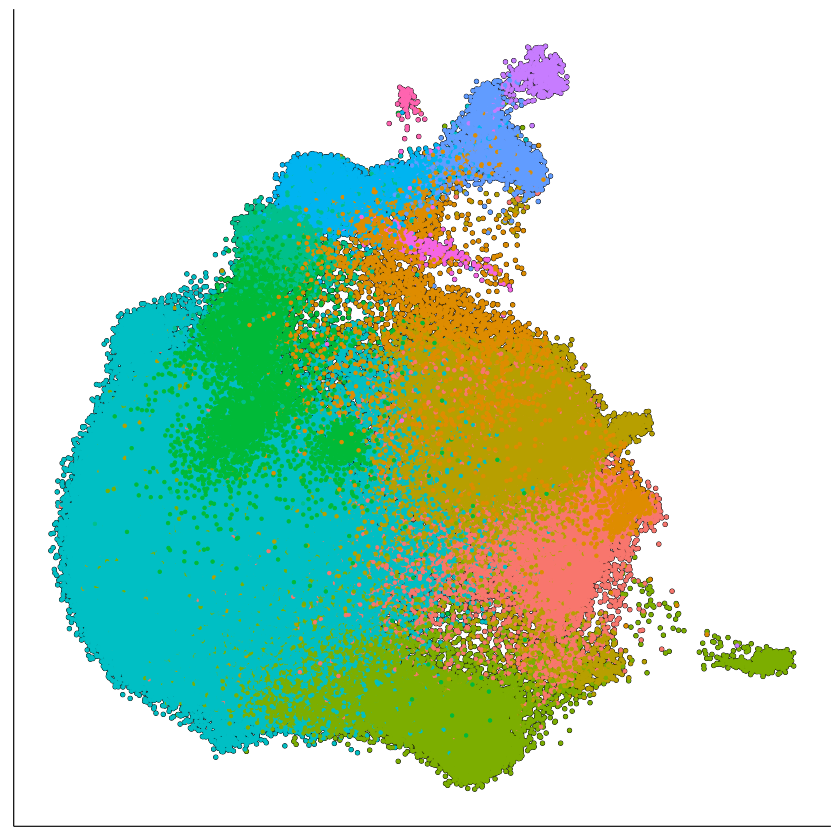

In [7]:
p_subtype <- plot_cells(cds, color_cells_by = "subtype_uni", label_leaves = F, label_branch_points = F, label_principal_points = F, label_groups_by_cluster = F, label_cell_groups = F, group_label_size = 5, show_trajectory_graph = F, cell_size = 0.5, cell_stroke = 0.3) +
    theme(axis.text = element_blank(), 
          axis.ticks = element_blank(),
          axis.title = element_blank(), 
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(), 
          legend.position="none")
print(p_subtype)

In [8]:
ggsave("ast_umat_subtype_uni.png", plot = p_subtype, width = 6, height = 6, dpi = 150)

In [ ]:
p_subtype_legends <- plot_cells(cds, color_cells_by = "subtype_uni", label_leaves = F, label_branch_points = F, label_principal_points = F, label_groups_by_cluster = F, label_cell_groups = F, group_label_size = 5, show_trajectory_graph = F, cell_size = 0.5, cell_stroke = 0.3)

In [13]:
# Extract legend
legend <- cowplot::get_legend(p_subtype_legends)
pdf("ast_umat_subtype_uni_legend_only.pdf")
    grid::grid.draw(legend)
dev.off()

png 
  2

#### pseudotime

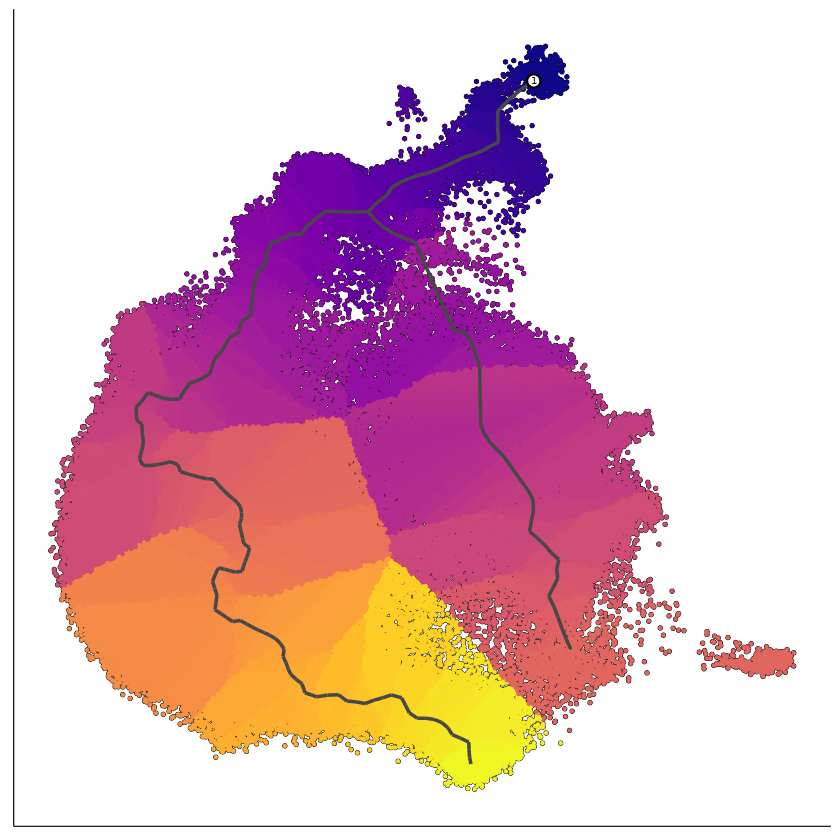

In [29]:
# midcolor
p_pseudotime <- plot_cells(cds, color_cells_by = "pseudotime", label_leaves = F, label_branch_points = F, label_principal_points = F, label_groups_by_cluster = F, label_cell_groups = F, cell_size = 0.5, cell_stroke = 0.3) + 
        theme(axis.text = element_blank(), 
          axis.ticks = element_blank(),
          axis.title = element_blank(), 
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(), 
          legend.position="none")
print(p_pseudotime)

In [31]:
ggsave("ast_umat_pseudotime.png", plot = p_pseudotime, width = 6, height = 6, dpi = 150)

#### Trajectory marker gene

In [ ]:
p_gfap <- plot_cells(cds, genes = c("GFAP"), norm_method = "log", label_roots = F, label_leaves = F, label_branch_points = F, label_principal_points = F, label_groups_by_cluster = F, label_cell_groups = F, show_trajectory_graph = T, cell_size = 0.5, cell_stroke = 0.3) + scale_color_distiller(palette = "Spectral") +
    theme(title = element_blank(), 
          axis.text = element_blank(), 
          axis.ticks = element_blank(),
          axis.title = element_blank(), 
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(), 
          legend.position="none") # AST-WM
print(p_gfap)
ggsave("files/freeze3/figures/ast_umat_expr_gfap.png", plot = p_gfap, width = 6, height = 6, dpi = 150)

p_slc1a2 <- plot_cells(cds, genes = c("SLC1A2"), norm_method = "log", label_roots = F, label_leaves = F, label_branch_points = F, label_principal_points = F, label_groups_by_cluster = F, label_cell_groups = F, show_trajectory_graph = T, cell_size = 0.5, cell_stroke = 0.3) + scale_color_distiller(palette = "Spectral") +
    theme(title = element_blank(), 
          axis.text = element_blank(), 
          axis.ticks = element_blank(),
          axis.title = element_blank(), 
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(), 
          legend.position="none") # AST-GM
ggsave("files/freeze3/figures/ast_umat_expr_slc1a2.png", plot = p_slc1a2, width = 6, height = 6, dpi = 150)


p_mbp <- plot_cells(cds, genes = c("MBP"), norm_method = "log", label_roots = F, label_leaves = F, label_branch_points = F, label_principal_points = F, label_groups_by_cluster = F, label_cell_groups = F, show_trajectory_graph = T, cell_size = 0.5, cell_stroke = 0.3) + scale_color_distiller(palette = "Spectral") +
    theme(title = element_blank(), 
          axis.text = element_blank(), 
          axis.ticks = element_blank(),
          axis.title = element_blank(), 
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(), 
          legend.position="none") # MBP
ggsave("files/freeze3/figures/ast_umat_expr_mbp.png", plot = p_mbp, width = 6, height = 6, dpi = 150)


In [10]:
p_gfap_legends <- plot_cells(cds, genes = c("GFAP"), norm_method = "log", label_roots = F, label_leaves = F, label_branch_points = F, label_principal_points = F, label_groups_by_cluster = F, label_cell_groups = F, show_trajectory_graph = T, cell_size = 0.5, cell_stroke = 0.3) + scale_color_distiller(palette = "Spectral")
# Extract legend
legend <- cowplot::get_legend(p_gfap_legends)
pdf("files/freeze3/figures/ast_umat_expr_gfap_legend_only.pdf")
    grid::grid.draw(legend)
dev.off()

p_slc1a2_legends <- plot_cells(cds, genes = c("SLC1A2"), norm_method = "log", label_roots = F, label_leaves = F, label_branch_points = F, label_principal_points = F, label_groups_by_cluster = F, label_cell_groups = F, show_trajectory_graph = T, cell_size = 0.5, cell_stroke = 0.3) + scale_color_distiller(palette = "Spectral")
# Extract legend
legend <- cowplot::get_legend(p_slc1a2_legends)
pdf("files/freeze3/figures/ast_umat_expr_slc1a2_legend_only.pdf")
    grid::grid.draw(legend)
dev.off()

p_mbp_legends <- plot_cells(cds, genes = c("MBP"), norm_method = "log", label_roots = F, label_leaves = F, label_branch_points = F, label_principal_points = F, label_groups_by_cluster = F, label_cell_groups = F, show_trajectory_graph = T, cell_size = 0.5, cell_stroke = 0.3) + scale_color_distiller(palette = "Spectral")
# Extract legend
legend <- cowplot::get_legend(p_mbp_legends)
pdf("files/freeze3/figures/ast_umat_expr_mbp_legend_only.pdf")
    grid::grid.draw(legend)
dev.off()

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

## Maturation rate of branches and lineages

### Maturation rate of lineages

In [ ]:
plot_basic_density_ridgeline_pseudo_lineage_branch(cds, "Astro_PLSCR1;Astro_ADAMTSL3", "ast_mature_ratio", 5, 5, 1440)

### Regression of pseudotime along age

In [6]:
pdf("ast_mature_ratio_regression.pdf", width = 4.5, height = 4.5)
regress_pt_along_age(cds, "Astrocyte")
dev.off()

png 
  2

## Identify DEGs along trajectory

### Using modified moran test

In [ ]:
%%sh

for sub_lineage in Astro_PLSCR1 Astro_ADAMTSL3
do
    Rscript modified_moran_test_lineage.R \
        aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_AST_scanpy6000_25_sparse_123456_afterCombination_cds.RDS \
        ${sub_lineage} \
        863 \
        0.05 \
        10000 \
        40 \
        DEGs_moran_test/modified_10000/AST
done # for sub_lineage end

## Compress data along each lineage into 500 meta-cells

In [5]:
cds <- compress_lineages(cds, 863, N = 500, cores = 40)
print(cds)
print(length(cds@expression))

[1] "Astro_PLSCR1"



Projecting cells to principal points for partition: 1



[1] "Window: 234.78"
[1] "Step: 234.31044"
[1] "Compressing lineage Astro_PLSCR1 and fitting curves"


Loading required package: speedglm

Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


The following object is masked from ‘package:S4Vectors’:

    expand


Loading required package: MASS


Attaching package: ‘MASS’


The following object is masked from ‘package:dplyr’:

    select


Loading required package: biglm

Loading required package: DBI



[1] "Astro_ADAMTSL3"



Projecting cells to principal points for partition: 1



[1] "Window: 77.134"
[1] "Step: 76.979732"
[1] "Compressing lineage Astro_ADAMTSL3 and fitting curves"


Warning message in speedglm(model, data = exp_data.sel, family = family, acc = 0.001, :
“Maximum number of iterations reached without convergence”
Warning message in speedglm(model, data = exp_data.sel, family = family, acc = 0.001, :
“Maximum number of iterations reached without convergence”


class: cell_data_set_ext 
dim: 14613 173241 
metadata(0):
assays(2): counts logcounts
rownames(14613): DPM1 SCYL3 ... OOSP1 C8orf44-SGK3
rowData names(2): gene_name gene_short_name
colnames(173241): H1007-1-AACACACAGTAATTGG-0-Aging
  H1007-1-AACTTCTCATCTCGTC-0-Aging ...
  TTTGTTGAGCGATTCT-RL2132_25yr_v3-Lister
  TTTGTTGCACAAGCTT-RL2132_25yr_v3-Lister
colData names(55): orig.ident nCount_RNA ... ident Size_Factor
reducedDimNames(1): UMAP
mainExpName: RNA
altExpNames(0):
[1] 2


In [6]:
saveRDS(cds, file = "aging_lister_integrated_ds1000_rmno_scanpy6000_half_100_123456_beforeUMAT_AST_scanpy6000_25_sparse_123456_afterCombination_cds_compressed.RDS")
